In [11]:
import pandas as pd
import numpy as np
import os

def DT(a,b=2):
    n=5
    if b==1:
        n=7
    Date,sTime= a[n:].split(" ")
    sD,sM,sY=Date.split("/")
    return str(sY)+'-'+str(sM)+'-'+str(sD)+' '+str(sTime)

In [12]:
def find_dates(Lpath):
    c=0
    f=os.open(Lpath, os.O_RDONLY)
    start=''
    end=''
    f=0
    for i in os.read(f,100):
        if chr(i)=='\n':
            if c>=0 and c<2:
                f=1
            else:
               f=0
            c+=1
        if f==1 and c==1:
            start+=chr(i)
        elif f==1 and c==2:
            end+=chr(i)
    os.close(f)
    return start,end

## Cleaning the Data

In [13]:
def trim_date(start):
    start=DT(start,1)
    return start

In [14]:
def Append_timeFrame(df,start):
    dft=[]
    for i in range(len(df)):
        dft.append(pd.Timestamp(start))
        start = pd.Timestamp(start)+pd.to_timedelta(1000, unit='microseconds')
    df['Timestamp']=dft
    df=df.set_index('Timestamp')
    return df

In [15]:
def Drop(df):
    for i in df.index:
        if df.loc[i].isna().any():
            df=df.drop(index=i)
    return df

## Pre-processing

In [16]:
## minimize the range from 0 to 1

def Normalize(df):
    ## Bring the minimum to positive
    df2=df.describe()
    minimum=min(df2.loc['min'])
    if minimum<0:
        for i in df.columns:
            df.loc[:,i]=df.loc[:,i]+abs(minimum)
    df2=df.describe()
    ## Turn the maximum value to 1
    maximum= max(df2.loc['max'])
    for i in df.columns:
        df.loc[:,i]=df.loc[:,i]/maximum
    df2=df.describe()
    return df

In [17]:
def DataSmoothing(df):
    d=dict()
    c=0
    fs=100
    for k in df.columns:
        for i in range(0,len(df),fs):
            min_i,mi,max_j,ma=-1,1000,-1,-1000
            for j in range(min(fs,(len(df)-i))):
                if df.iloc[i+j][k]>ma:
                    ma=df.iloc[i+j][k]
                    max_j=i+j
                if df.iloc[i+j][k]<mi:
                    mi=df.iloc[i+j][k]
                    min_i=i+j
            if k not in list(d.keys()):
                    d[k]=[]
            if min_i<max_j:
                d[k].extend([mi,ma])
            else:
                d[k].extend([mi,ma])
    d=pd.DataFrame(d)
    return d

In [18]:
def filter(df,d):
    import numpy as np
    from scipy.signal import sosfiltfilt, butter
    sos = butter(2, .2, output='sos')
    filtered = dict()
    for i in df.columns:
        if i not in list(filtered.keys()):
            filtered[i]=[]
        x=np.array(d.loc[:,i])
        filtered[i]=sosfiltfilt(sos,x )
    filtered=pd.DataFrame(filtered)
    return filtered 

In [19]:
###Count the number of oscillaions
def oscillations(filtered):
    val=[]
    t20=[]
    for k in filtered.columns:
        m=filtered.loc[:,k].mean()
        c=0
        f=1
        a=list(filtered.loc[:,k])
        a=sorted(a)[:len(a)//5]
        f=0
        for i in range(0,len(filtered)):
            if filtered.iloc[i][k]>a[-1]:
                f=1
            if filtered.iloc[i][k]<a[-1] and f==1:
                f=0
                c+=1
        val.append(c)
        t20.append(a[-1])
    return val,t20
    

In [20]:
###parsing from the Directory
path="C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/SEMG_DB1/"
##Array for the logs and txt
Arr=["A_LOG","N_LOG","A_TXT","N_TXT"]
column=[ "Segment",
         "RF min","RF max","RF std","RF oscillations","RF t20-b",
         "BF min","BF max","BF std","BF oscillations","BF t20-b",
         "VM min","VM max","VM std","VM oscillations","VM t20-b",
         "ES min","ES max","ES std","ES oscillations","ES t20-b",
         "FE min","FE max","FE std","FE oscillations","FE t20-b",
         "duration","Label"]
data=pd.DataFrame(columns=column)
data=data.set_index('Segment')
for i in range(2):
    for j in os.listdir(path+Arr[i]):
        Tpath=path+Arr[i+2]+'/'+j[:-3]+'txt'
        print(Tpath)
        Lpath=path+Arr[i]+'/'+j
        nms=["Recto Femoral", "Biceps Femoral", "Vasto Medial", "EMG Semitendinoso", "Flexo-Extension"]
        df=pd.read_csv(Tpath, skiprows=7, delimiter="\t",names=nms)
        start,end=find_dates(Lpath)
        start=DT(start,1)
        end=DT(end,2)
        r=pd.Timestamp(end)-pd.Timestamp(start)
        sec=r.total_seconds()
        df=Append_timeFrame(df,start)
        df2=df.copy()
        df=Drop(df)
        df=Normalize(df)
        d=DataSmoothing(df)
        filtered=filter(df,d)
        val,t20=oscillations(filtered)
        d3=df.describe()
        label=1
        if i==0:
            label=0
        data.loc[j[:-4]]=[d3.loc['min'][nms[0]],d3.loc['max'][nms[0]],d3.loc['std'][nms[0]],val[0],t20[0],
                          d3.loc['min'][nms[1]],d3.loc['max'][nms[1]],d3.loc['std'][nms[1]],val[1],t20[1],
                          d3.loc['min'][nms[2]],d3.loc['max'][nms[2]],d3.loc['std'][nms[2]],val[2],t20[2],
                          d3.loc['min'][nms[3]],d3.loc['max'][nms[3]],d3.loc['std'][nms[3]],val[0],t20[3],
                          d3.loc['min'][nms[4]],d3.loc['max'][nms[4]],d3.loc['std'][nms[4]],val[4],t20[4],sec,label]
        


C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/SEMG_DB1/A_TXT/10Amar.txt
C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/SEMG_DB1/A_TXT/10Apie.txt
C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/SEMG_DB1/A_TXT/10Asen.txt
C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/SEMG_DB1/A_TXT/11Amar.txt
C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/SEMG_DB1/A_TXT/11Apie.txt
C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/SEMG_DB1/A_TXT/11Asen.txt
C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/SEMG_DB1/A_TXT/1Amar.txt
C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/SEMG_DB1/A_TXT/1Apie.txt
C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/SEMG_DB1/A_TXT/1Asen.txt
C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/SEMG_DB1/A_TXT/2Amar.txt
C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/SEMG_DB1/A_TXT/2Apie.txt
C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/SEMG_DB1/A_TXT/2Asen.txt
C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/SEMG_DB1/A_TXT/3Amar.txt
C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/SEMG_DB1/A_TXT/3Apie.txt


In [22]:
data.to_csv('C:/Users/KOTA SRI SURYA TEJA/Desktop/Capstone/Output.csv')

Recto Femoral 0.004358032014979219 14
Biceps Femoral 0.0043892804273371715 18
Vasto Medial 0.004414100180735283 20
EMG Semitendinoso 0.12421128810875968 15
Flexo-Extension 0.45961820851688684 0


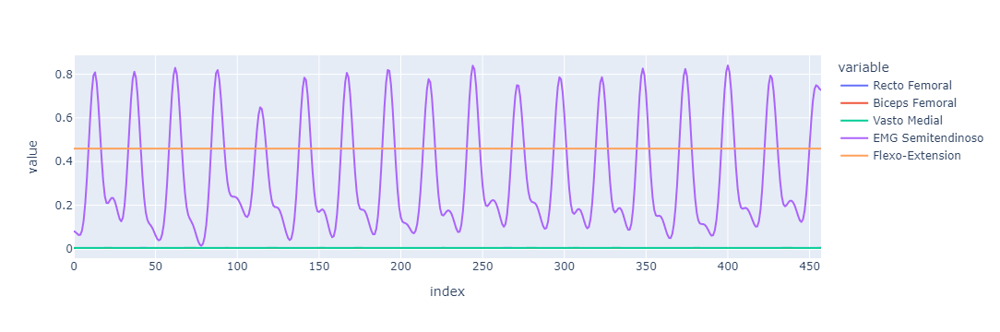

In [648]:
for k in filtered.columns:
    m=filtered.loc[:,k].mean()
    c=0
    f=1
    a=list(filtered.loc[:,k])
    a=sorted(a)[:len(a)//5]
    f=0
    for i in range(0,len(filtered)):
        if filtered.iloc[i][k]>a[-1]:
            f=1
        if filtered.iloc[i][k]<a[-1] and f==1:
            f=0
            c+=1
    print(k, a[-1],c)
import plotly.express as px

fig=px.line(filtered)
fig.show()

In [649]:
df.describe()

,Recto Femoral,Biceps Femoral,Vasto Medial,EMG Semitendinoso,Flexo-Extension
count,22896.000000,22896.000000,22896.000000,22896.000000,2.289600e+04
mean,0.004395,0.004404,0.004428,0.334607,4.596182e-01
std,0.000165,0.000082,0.000220,0.284325,8.820915e-14
min,0.002808,0.003480,0.002599,0.000000,4.596182e-01
25%,0.004338,0.004372,0.004361,0.120411,4.596182e-01
50%,0.004394,0.004405,0.004416,0.208517,4.596182e-01
75%,0.004449,0.004427,0.004471,0.555066,4.596182e-01
max,0.007048,0.005374,0.007565,1.000000,4.596182e-01


C:\Users\KOTA SRI SURYA TEJA\.conda\envs\test\lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



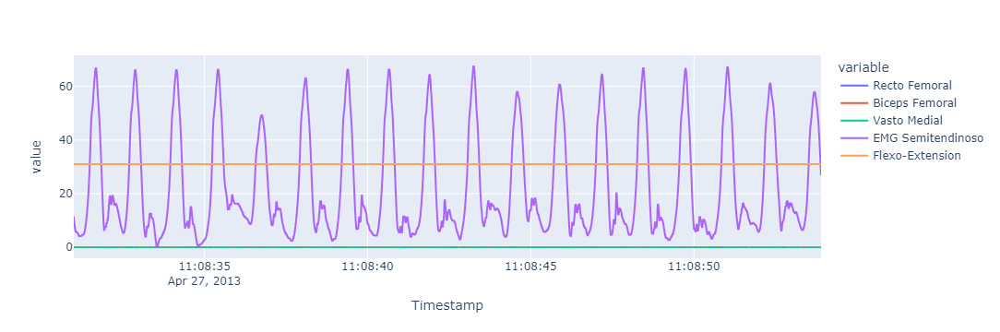

In [651]:
import plotly.express as px
fig=px.line(df2)
fig.show()